In [1]:
import pandas as pd
import itertools
import string
import numpy as np
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
pd.set_option('display.max_rows',20)


ModuleNotFoundError: No module named 'pandas'

In [ ]:
df=pd.read_csv('drugsComTrain_raw.tsv',sep='\t')
df

,Unnamed: 0,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combinati...",9.0,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of ...",8.0,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, wh...",5.0,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth...",8.0,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around...",9.0,"November 27, 2016",37
...,...,...,...,...,...,...,...
161292,191035,Campral,Alcohol Dependence,"""I wrote my first report in Mid-October of 201...",10.0,"May 31, 2015",125
161293,127085,Metoclopramide,Nausea/Vomiting,"""I was given this in IV before surgey. I immed...",1.0,"November 1, 2011",34
161294,187382,Orencia,Rheumatoid Arthritis,"""Limited improvement after 4 months, developed...",2.0,"March 15, 2014",35
161295,47128,Thyroid desiccated,Underactive Thyroid,"""I&#039;ve been on thyroid medication 49 years...",10.0,"September 19, 2015",79


In [ ]:
pd.set_option('display.max_rows', None)
df.condition.value_counts()


condition
Birth Control                                                          28788
Depression                                                              9069
Pain                                                                    6145
Anxiety                                                                 5904
Acne                                                                    5588
Bipolar Disorde                                                         4224
Insomnia                                                                3673
Weight Loss                                                             3609
Obesity                                                                 3568
ADHD                                                                    3383
Diabetes, Type 2                                                        2554
Emergency Contraception                                                 2463
High Blood Pressure                                               

In [ ]:
df_train =df[(df['condition']=='Birth Control') | (df['condition']=='Depression') |(df['condition']=='Migrane')|(df['condition']=='Pain')|(df['condition']=='Abnormal Uterine Bleeding')
             |(df['condition']=='Vaginal Yeast Infection')|(df['condition']=='High Blood Pressure')|(df['condition']=='Diabetes, Type 2')|(df['condition']=='Insomnia')|(df['condition']=='Acne')
             |(df['condition']=='Constipation')|(df['condition']=='Chronic Pain')]

In [ ]:
df.shape

(161297, 7)

In [ ]:
df_train.shape


(65558, 7)

In [ ]:

X = df_train.drop(['Unnamed: 0','drugName','rating','date','usefulCount'],axis=1)


EDA

In [ ]:
X.condition.value_counts()

condition
Birth Control                28788
Depression                    9069
Pain                          6145
Acne                          5588
Insomnia                      3673
Diabetes, Type 2              2554
High Blood Pressure           2321
Vaginal Yeast Infection       2274
Abnormal Uterine Bleeding     2096
Constipation                  1595
Chronic Pain                  1455
Name: count, dtype: int64

In [ ]:
#SEGREGATING FOR ANALYZING INDIVIDUAL CONDITION
X_birth=X[(X['condition']=='Birth Control')]
X_dep  =X[(X['condition']=='Depression')]
X_pa   =X[(X['condition']=='Pain')]
X_Ac   =X[(X['condition']=='Acne')]
X_Ins  =X[(X['condition']=='Insomnia')]
X_Dia  =X[(X['condition']=='Diabetes, Type 2')]
X_Hibp =X[(X['condition']=='High Blood Pressure')]
X_VYI  =X[(X['condition']=='Vaginal Yeast Infection')]
X_AUB  =X[(X['condition']=='Abnormal Uterine Bleeding')]
X_Cons =X[(X['condition']=='Constipation')]
X_Chrpn=X[(X['condition']=='Chronic Pain')]
X_btest=X[(X['condition']=='Blood Test')]


Text(0.5, 1.0, 'Word cloud for Birth control')

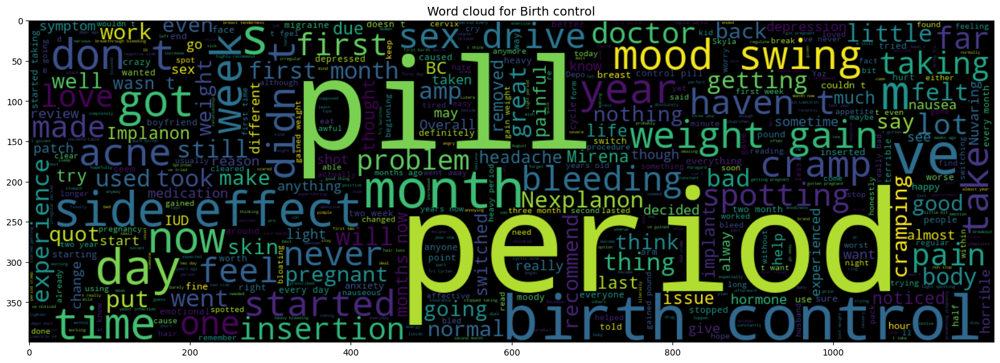

In [ ]:
#segregating dataframe for analyzing Birth Control condition

from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_birth.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Birth control',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

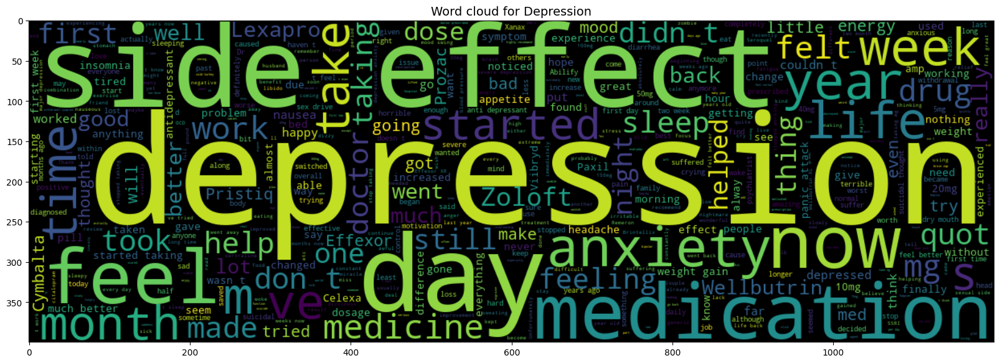

In [ ]:
#segregating dataframe for analyzing Depression condition

from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_dep.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Pain')

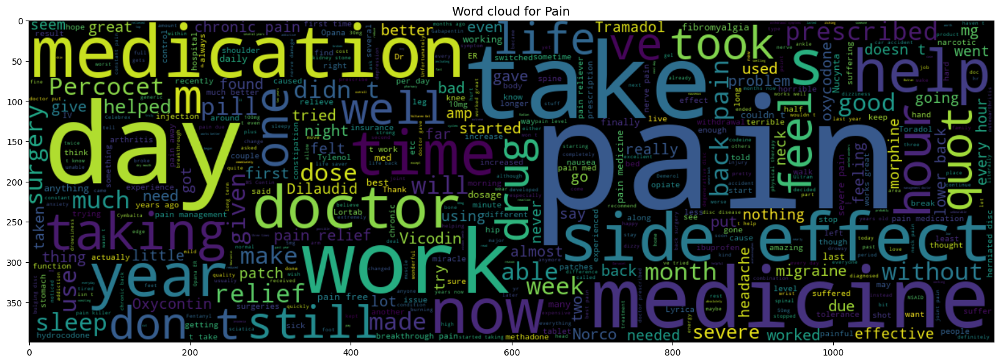

In [ ]:
#segregating dataframe for analyzing Pain condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_pa.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Pain',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Acne')

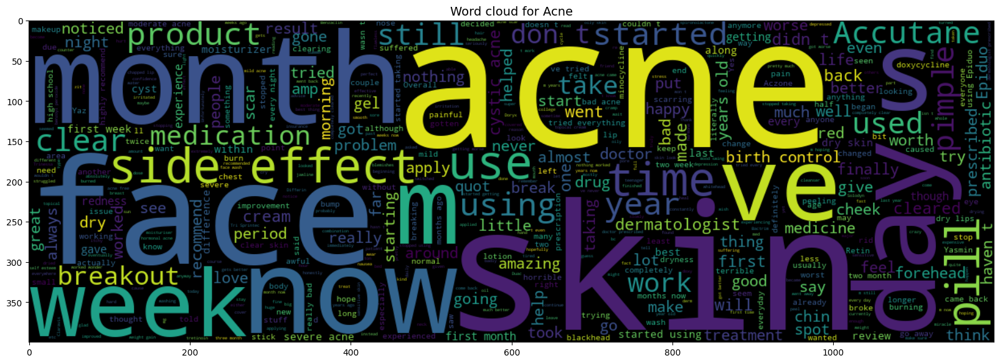

In [ ]:
#segregating dataframe for analyzing Acne condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Ac .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Acne',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Insomnia')

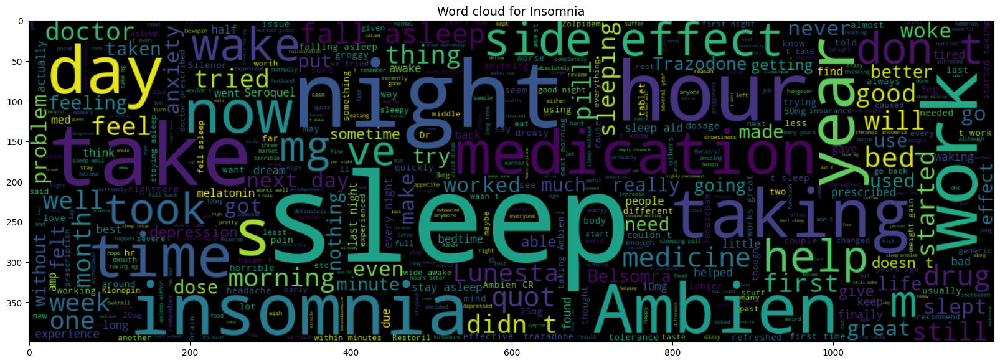

In [ ]:
#segregating dataframe for Insomnia analyzing  condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Ins.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Insomnia',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes')

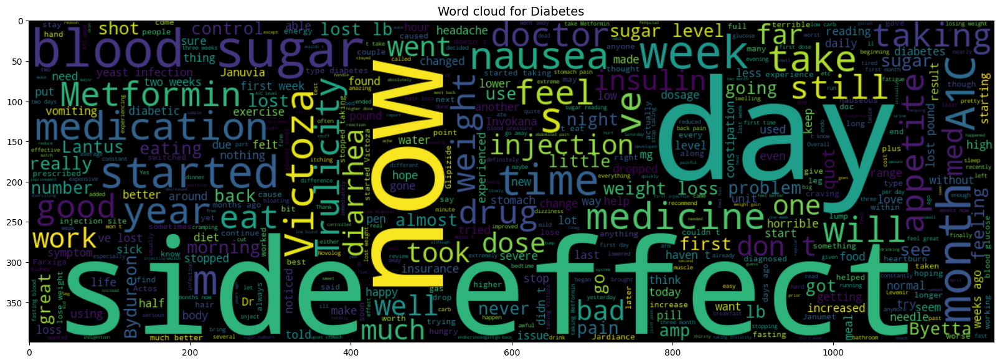

In [ ]:
#segregating dataframe for Diabetes analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Dia .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Diabetes',fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

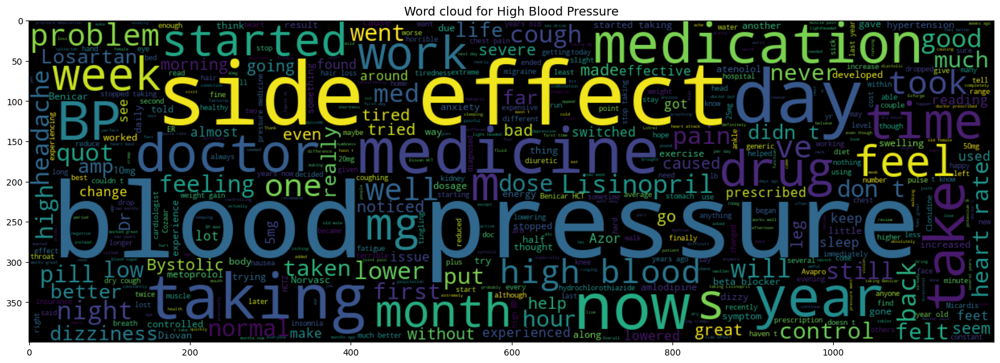

In [ ]:
#segregating dataframe for High Blood Pressure analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Hibp.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Vaginal Yeast Infection ')

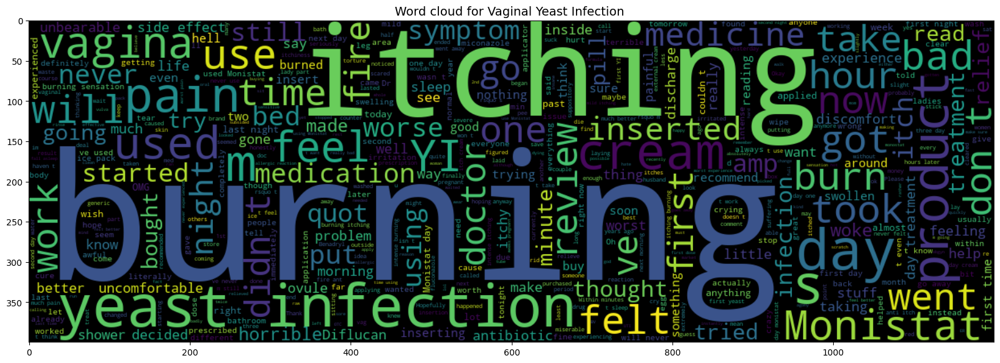

In [ ]:
#segregating dataframe for Vaginal Yeast Infection analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_VYI .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Vaginal Yeast Infection ',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Abnormal Uterine Bleeding ')

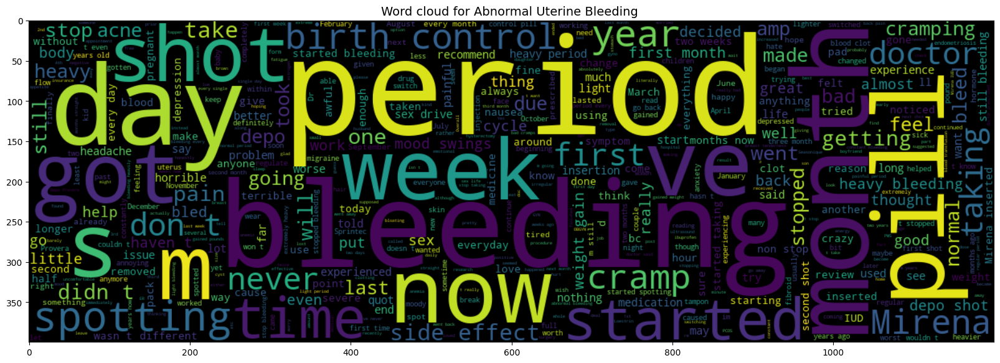

In [ ]:
#segregating dataframe for Abnormal Uterine Bleeding analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_AUB.review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Abnormal Uterine Bleeding ',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Constipation ')

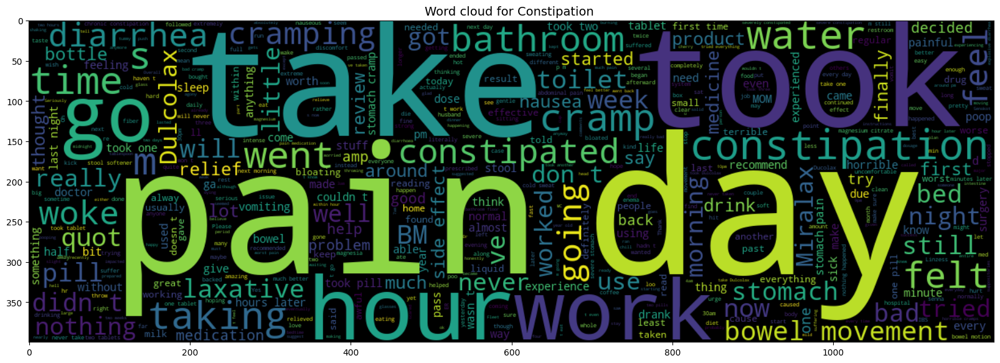

In [ ]:
#segregating dataframe for Constipation analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Cons .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Constipation ',fontsize=14)


Text(0.5, 1.0, 'Word cloud for Chronic Pain ')

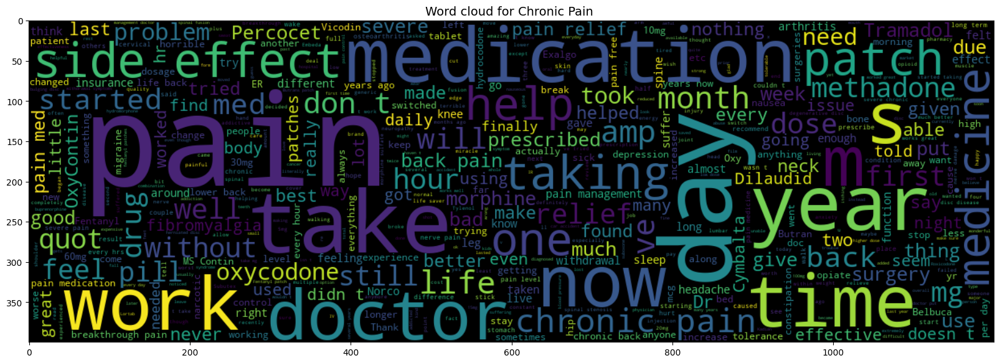

In [ ]:
#segregating dataframe for Chronic Pain analyzing condition
from wordcloud import WordCloud
plt.figure(figsize =(20,20))  #text that is Fake News Headlines
wc =WordCloud(max_words =500 ,width =1200,height =400).generate(" ".join(X_Chrpn .review))
plt.imshow(wc,interpolation='bilinear')
plt.title('Word cloud for Chronic Pain ',fontsize=14)


Data Preprocessing


In [ ]:
X['review'][2]

'"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."'

In [ ]:
for i,col in enumerate(X.columns):
    X.iloc[:,i] = X.iloc[:,i].str.replace('"', '')

In [ ]:
import pandas as pd

pd.set_option('max_colwidth', None)


In [ ]:
X.head()

,condition,review
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger."
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."
14,Birth Control,"Started Nexplanon 2 months ago because I have a minimal amount of contraception&#039;s I can take due to my inability to take the hormone that is used in most birth controls. I&#039;m trying to give it time because it is one of my only options right now. But honestly if I had options I&#039;d get it removed.\r\nI&#039;ve never had acne problems in my life, and immediately broke out after getting it implanted. Sex drive is completely gone, and I used to have sex with my boyfriend a few days a week, now its completely forced and not even fun for me anymore. I mean I&#039;m on birth control because I like having sex but don&#039;t want to get pregnant, why take a birth control that takes away sex? Very unhappy and hope that I get it back with time or I&#039;m getting it removed."


Stopwords

In [ ]:
import nltk
nltk.download('stopwords')# Download stopwords data (if needed)
nltk.download('wordnet')


from nltk.corpus import stopwords
stop = stopwords.words('english')

print(stop[:10])  # Print the first 10 stopwords for demonstration


['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\shree\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\shree\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Lemmitization

In [ ]:
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

porter = PorterStemmer()

lemmatizer = WordNetLemmatizer()

In [ ]:
print(porter.stem("sportingly"))
print(porter.stem("very"))
print(porter.stem("troubled"))

sportingli
veri
troubl


In [ ]:
print(lemmatizer.lemmatize("sportingly"))
print(lemmatizer.lemmatize("very"))
print(lemmatizer.lemmatize("troubled"))

sportingly
very
troubled


In [ ]:
from bs4 import BeautifulSoup
import re

In [ ]:
def review_to_words(raw_review):
    # 1. Delete HTML 
    review_text = BeautifulSoup(raw_review, 'html.parser').get_text()
    # 2. Make a space
    letters_only = re.sub('[^a-zA-Z]', ' ', review_text)
    # 3. lower letters
    words = letters_only.lower().split()
    # 5. Stopwords 
    meaningful_words = [w for w in words if not w in stop]
    # 6. lemmitization
    lemmitize_words = [lemmatizer.lemmatize(w) for w in meaningful_words]
    # 7. space join words
    return( ' '.join(lemmitize_words))

In [ ]:
X['review_clean'] = X['review'].apply(review_to_words)

C:\Users\shree\AppData\Local\Temp\ipykernel_9888\2066199760.py:3: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  review_text = BeautifulSoup(raw_review, 'html.parser').get_text()


In [ ]:
X.head()

,condition,review,review_clean
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\r\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",used take another oral contraceptive pill cycle happy light period max day side effect contained hormone gestodene available u switched lybrel ingredient similar pill ended started lybrel immediately first day period instruction said period lasted two week taking second pack two week third pack thing got even worse third period lasted two week end third week still daily brown discharge positive side side effect idea period free tempting ala
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",first time using form birth control glad went patch month first decreased libido subsided downside made period longer day exact used period day max also made cramp intense first two day period never cramp using birth control happy patch
9,Birth Control,"I had been on the pill for many years. When my doctor changed my RX to chateal, it was as effective. It really did help me by completely clearing my acne, this takes about 6 months though. I did not gain extra weight, or develop any emotional health issues. I stopped taking it bc I started using a more natural method of birth control, but started to take it bc I hate that my acne came back at age 28. I really hope symptoms like depression, or weight gain do not begin to affect me as I am older now. I&#039;m also naturally moody, so this may worsen things. I was in a negative mental rut today. Also I hope this doesn&#039;t push me over the edge, as I believe I am depressed. Hopefully it&#039;ll be just like when I was younger.",pill many year doctor changed rx chateal effective really help completely clearing acne take month though gain extra weight develop emotional health issue stopped taking bc started using natural method birth control started take bc hate acne came back age really hope symptom like depression weight gain begin affect older also naturally moody may worsen thing negative mental rut today also hope push edge believe depressed hopefully like younger
11,Depression,"I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\r\n\r\nI only take Cymbalta now mostly for pain.\r\n\r\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects.",taken anti depressant year improvement mostly moderate severe side affect make go take cymbalta mostly pain began deplin noticed major improvement overnight energy better disposition sinking low low major depression taking month feel like normal person first time ever best thing side effect
14,Birth Control,"Started Nexplanon 2 months ago because I have a minim

Features and Target Variables

In [ ]:
print("hello")

hello


In [2]:
print("hello world")

hello world
